# Convert PDF to Image PNG

In [5]:
# import fitz
# import subprocess
# import os

# def get_image_page(pdf_file, out_file, page_num):
#     page = str(page_num + 1)
#     command = ["gs", "-q", "-dNOPAUSE", "-dBATCH", "-sDEVICE=png16m", "-r" + str(RESOLUTION), "-dPDFFitPage",
#                "-sOutputFile=" + out_file, "-dFirstPage=" + page, "-dLastPage=" + page,
#                pdf_file]
#     f_null = open(os.devnull, 'w')
#     subprocess.call(command, stdout=f_null, stderr=subprocess.STDOUT)

# pdffile = "/mnt/d/docker_volume/room_of_nhanhuynh/ai_butler/CAD-ShibaSangyo/data_test/inference_data/002-159　塩釜玉川4期　1号棟.pdf"
# doc = fitz.open(pdffile)
# page = doc.load_page(0)  # number of page
# pix = page.get_pixmap()
# output = "/mnt/d/docker_volume/room_of_nhanhuynh/ai_butler/CAD-ShibaSangyo/data_test/inference_data_image/outfile.png"
# pix.save(output)
# doc.close()

from pdf2image import convert_from_path

inputpath = "assets/1/test_(1).pdf"
outputpath = "assets/test_(1).png"

img = convert_from_path(inputpath,dpi= 500)
type(img[0])
img[0].save(outputpath)

PIL.PpmImagePlugin.PpmImageFile

# Main process DEMO

In [1]:
from src.cad_ocr.ocr_2 import OCR
from src.utils import load_image
import time

main_process = OCR(env_path='.env', gpf_path= 'GFPGAN/experiments/pretrained_models/GFPGANv1.3.pth',
                   draw_path='weight/best_draw.pt', core_path= 'weight/v10x_1280.pt', dict_path = 'weight/dict.pkl')


file = 'assets/outfile4.png'
image = load_image(file)
print('Starting config CAD')
main_process.destroy_all()
main_process.create_all()
main_process.__config_gfpgan__()
print('Save PIL to cache file')
file_cache = main_process.save_pil_to_file(pil_image= image)
print('Save PIL to cache file done')
print('Start Image resolution')
image_high_resolution = main_process.upscale_image(image_path= file_cache)
print('Extract CAD and Core of it')
main_process.extract_draw(image_high_resolution= image_high_resolution)
# main_process.extract_code(image_high_resolution= image_high_resolution)

# main_process.clear_all_excel()
print("Progressing OCR ...")
try:
    all_char, basic_inform = main_process.processOCR(image_high_res= image_high_resolution)

except:
    print("Error in OCR...\nTry to sleep 3s before recall")
    time.sleep(2)
    all_char, basic_inform = main_process.processOCR(image_high_res= image_high_resolution)


# result_comparing = main_process.calculator_similar(draw_information_list= all_char)
print('Writing result to excel file...')
path_result =  main_process.write_to_excel(all_char, basic_inform)

/home/bu0ai/anaconda3/envs/shiba/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/bu0ai/anaconda3/envs/shiba/lib/python3.10/site-packages/torchvision/transforms/functional_tensor.py:5: UserWarning: The torchvision.transforms.functional_tensor module is deprecated in 0.15 and will be **removed in 0.17**. Please don't rely on it. You probably just need to use APIs in torchvision.transforms.functional or in torchvision.transforms.v2.functional.
  warnings.warn(


Load success dict class
Azure Computer Vision Client is ready to use!
Starting config CAD
Detect cache
Deleting all cache


/home/bu0ai/anaconda3/envs/shiba/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/bu0ai/anaconda3/envs/shiba/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


GFPGAN Model is ready to use ...!
Save PIL to cache file
Save PIL to cache file done
Start Image resolution
Done
Extract CAD and Core of it
Progressing OCR ...


/mnt/d/docker_volume/room_of_nhanhuynh/ai_butler/CAD-ShibaSangyo/full_build_from_scratch_nhanhuynh/src/utils_azure.py:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_builder_name.sort_values(by='top', inplace=True)
/mnt/d/docker_volume/room_of_nhanhuynh/ai_butler/CAD-ShibaSangyo/full_build_from_scratch_nhanhuynh/src/utils_azure.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_anken.sort_values(by='top', inplace=True)


[[803, 1721, 3006, 3849], [3540, 1716, 5756, 3844]]
Error in OCR...
Try to sleep 3s before recall


/mnt/d/docker_volume/room_of_nhanhuynh/ai_butler/CAD-ShibaSangyo/full_build_from_scratch_nhanhuynh/src/utils_azure.py:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_builder_name.sort_values(by='top', inplace=True)
/mnt/d/docker_volume/room_of_nhanhuynh/ai_butler/CAD-ShibaSangyo/full_build_from_scratch_nhanhuynh/src/utils_azure.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_anken.sort_values(by='top', inplace=True)


[[803, 1721, 3006, 3849], [3540, 1716, 5756, 3844]]


AttributeError: 'dict' object has no attribute 'shape'

# Check Performance of YOLO

In [ ]:
[803, 1721, 3006, 3849]
[3540, 1716, 5757, 3844]

In [1]:
from src.utils import *
from src.visualize import *

file = 'temp/temp_azure_cad/temp_original_file.png'

image = load_image(file)
img_infer =  image.crop([803, 1721, 3006, 3849]).copy()

model_core = load_yolo('weight/v10x_1280.pt', type_predict= 'code')

result = yolo_inference(img_infer, model_core, type='code')
# code_df = result[result.boxes.apply(lambda b: calc_ovl(b, draw_location) > 0.4)]
# code_df.reset_index(drop=True, inplace=True)
# print(len(code_df['boxes']))
result
for i in range(len(result['boxes'])):
    result['boxes'][i] = [result['boxes'][i][0] + 803,result['boxes'][i][1] + 1721,result['boxes'][i][2]+803,result['boxes'][i][3]+1721]

/home/bu0ai/anaconda3/envs/shiba/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/bu0ai/anaconda3/envs/shiba/lib/python3.10/site-packages/torchvision/transforms/functional_tensor.py:5: UserWarning: The torchvision.transforms.functional_tensor module is deprecated in 0.15 and will be **removed in 0.17**. Please don't rely on it. You probably just need to use APIs in torchvision.transforms.functional or in torchvision.transforms.v2.functional.
  warnings.warn(
/tmp/ipykernel_58017/1613374661.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result['boxes'][i] = [result['boxes'][i][0] + 803,result['boxes'][i][1] + 

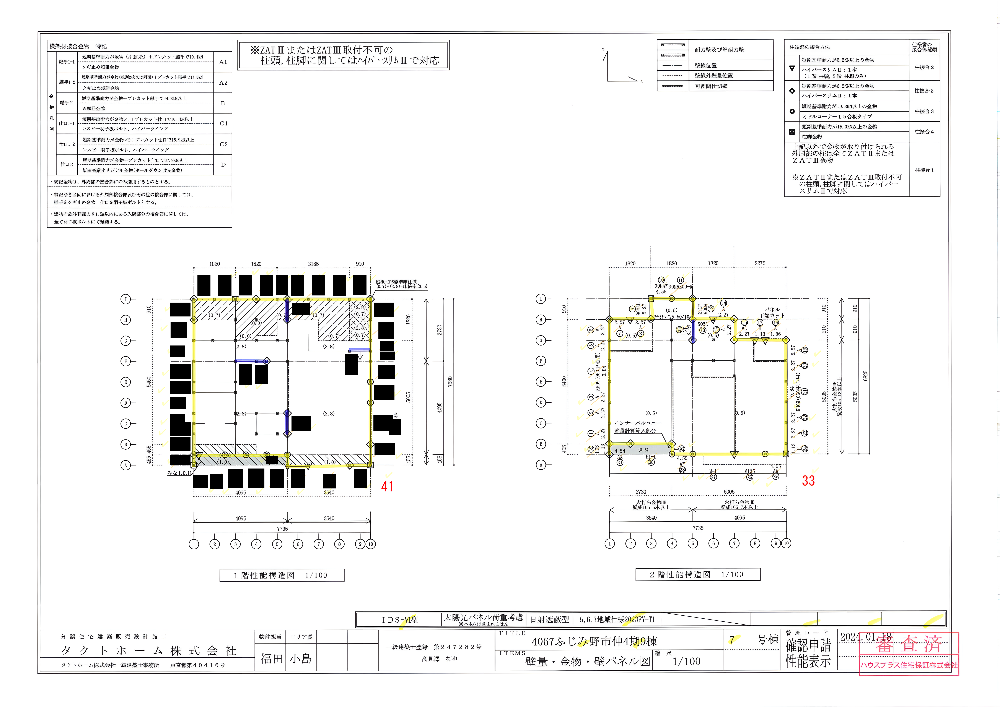

In [2]:
for i in range(len(result['boxes'])):
    img_show = draw_bbox_on_img(result['boxes'][i],image)
img_show

# Train YOLO

In [1]:
from ultralytics import YOLOv10

model = YOLOv10('yolov10x.pt')
results = model.train(data="/mnt/d/docker_volume/room_of_nhanhuynh/ai_butler/CAD-ShibaSangyo/full_build_from_scratch_nhanhuynh/CORE-1/data.yaml", epochs=2000, imgsz=1280,  batch=6)

/home/bu0ai/anaconda3/envs/shiba/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


TypeError: ModelHubMixin.__init_subclass__() got an unexpected keyword argument 'model_card_template'

# Export Enviroment

In [7]:
import os
import yaml

with open("environment.yml") as file_handle:
    environment_data = yaml.safe_load(file_handle)

for dependency in environment_data["dependencies"]:
    if isinstance(dependency, dict):
      for lib in dependency['pip']:
        os.system(f"pip install {lib}")

  Using cached argparse-1.4.0-py2.py3-none-any.whl.metadata (2.8 kB)
Using cached argparse-1.4.0-py2.py3-none-any.whl (23 kB)


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gdrive 0.1.5 requires google-api-python-client~=2.43.0, but you have google-api-python-client 2.134.0 which is incompatible.
gdrive 0.1.5 requires setuptools~=59.6.0, but you have setuptools 69.5.1 which is incompatible.
gdrive 0.1.5 requires wheel~=0.37.1, but you have wheel 0.43.0 which is incompatible.
